# Rainfall Prediction in Australia

## 1. Import Required Modules

In [1]:
# Import required modules
import csv
import sqlite3
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import math

import warnings
warnings.filterwarnings("ignore")

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, roc_auc_score, plot_confusion_matrix, roc_curve, classification_report, log_loss

## 2. Importing Data

In [2]:
# ---------------------------------------------------------------------
# Assignment Objective 2.2 : Import a CSV file into a Pandas DataFrame
# ---------------------------------------------------------------------

#Alternate way to directly import csv file to Pandas without using the SQLITE Database
df_csv = pd.read_csv("weatherAUS.csv")


## 3. Analysing Data

In [3]:
df_csv.head(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,...,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,No
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,No
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,...,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,...,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,No


In [4]:
df_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142267 entries, 0 to 142266
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142267 non-null  object 
 1   Location       142267 non-null  object 
 2   MinTemp        140783 non-null  float64
 3   MaxTemp        141007 non-null  float64
 4   Rainfall       139006 non-null  float64
 5   Evaporation    79531 non-null   float64
 6   Sunshine       72436 non-null   float64
 7   WindGustDir    131987 non-null  object 
 8   WindGustSpeed  132046 non-null  float64
 9   WindDir9am     131729 non-null  object 
 10  WindDir3pm     138042 non-null  object 
 11  WindSpeed9am   140502 non-null  float64
 12  WindSpeed3pm   139207 non-null  float64
 13  Humidity9am    139614 non-null  float64
 14  Humidity3pm    137762 non-null  float64
 15  Pressure9am    127203 non-null  float64
 16  Pressure3pm    127241 non-null  float64
 17  Cloud9am       86380 non-null

## 4. Data Cleaning

In [5]:
# Checking for null values in training dataset and also finding the percentage of them
missing_values = pd.DataFrame(df_csv.isnull().sum(),columns = ['Number of missing values'])
missing_values['% of Missing Values']= (missing_values/len(df_csv)).round(2)*100
missing_values

,Number of missing values,% of Missing Values
Date,0,0.0
Location,0,0.0
MinTemp,1484,1.0
MaxTemp,1260,1.0
Rainfall,3261,2.0
Evaporation,62736,44.0
Sunshine,69831,49.0
WindGustDir,10280,7.0
WindGustSpeed,10221,7.0
WindDir9am,10538,7.0


#### The above data is showing that almost half of the values for Evaporation and Sunshine, and 39% and 42% values are missing for Cloud9am and Cloud3pm. 
#### Let's first check how are these variables co-related to the Rainfall. 

<AxesSubplot:>

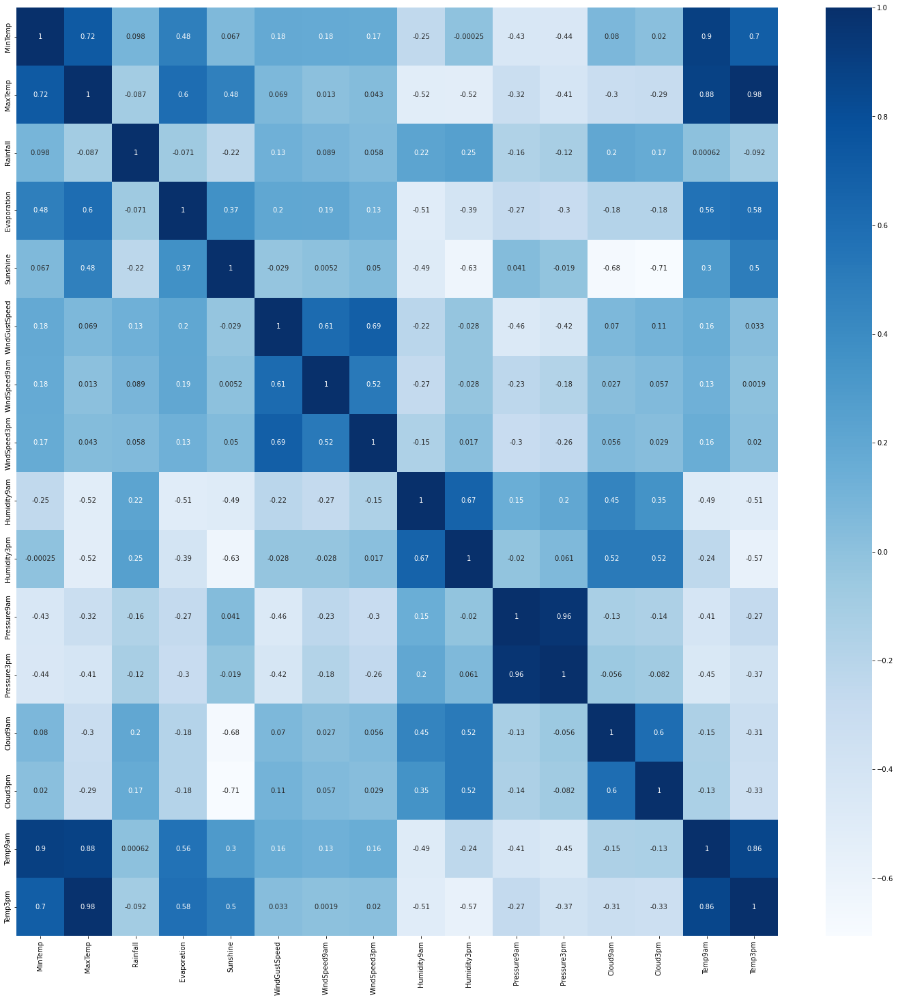

In [6]:
# ---------------------------------------------------------------------
# Assignment Objective 6.1 : Visualise- Plot charts with Seaborn
# ---------------------------------------------------------------------

correlation_matrix = df_csv.corr()
plt.figure(figsize=(25,25))
sns.heatmap(correlation_matrix,cmap='Blues',annot=True)

In [7]:
# Check if there are any duplicate values in data
df_csv.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
142262    False
142263    False
142264    False
142265    False
142266    False
Length: 142267, dtype: bool

In [8]:
# Result is showing that there are no duplicate values in the dataset

In [9]:
# We can drop sunshine,Evaporation,Cloud9am,Cloud3pm as most values are missing
# ----------------------------------------------------------------------------------
# Assignment Objective 3.2 : Dropping columns with high percentage of missing values
# ----------------------------------------------------------------------------------

df_csv.drop(['Sunshine', 'Evaporation', 'Cloud9am', 'Cloud3pm'],axis=1,inplace=True)

In [10]:
# We are now left with 19 columns after dropping columns above
df_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142267 entries, 0 to 142266
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           142267 non-null  object 
 1   Location       142267 non-null  object 
 2   MinTemp        140783 non-null  float64
 3   MaxTemp        141007 non-null  float64
 4   Rainfall       139006 non-null  float64
 5   WindGustDir    131987 non-null  object 
 6   WindGustSpeed  132046 non-null  float64
 7   WindDir9am     131729 non-null  object 
 8   WindDir3pm     138042 non-null  object 
 9   WindSpeed9am   140502 non-null  float64
 10  WindSpeed3pm   139207 non-null  float64
 11  Humidity9am    139614 non-null  float64
 12  Humidity3pm    137762 non-null  float64
 13  Pressure9am    127203 non-null  float64
 14  Pressure3pm    127241 non-null  float64
 15  Temp9am        140500 non-null  float64
 16  Temp3pm        138660 non-null  float64
 17  RainToday      139006 non-nul

In [11]:
# --------------------------------------
# Assignment Objective 4.2 : Using Numpy
# --------------------------------------

# Extact numerical features using numpy

num_col=df_csv.select_dtypes(include=np.number).columns.to_list()
print(len(num_col))

12


In [12]:
# ---------------------------------------------------------------------------
# Assignment Objective 4.1 : Define a custom function to create reusable code
# ---------------------------------------------------------------------------
def replace_numerical(df_csv):
    for col in df_csv.select_dtypes(['int', 'float']):
        df_csv[col] = df_csv[col].fillna(df_csv[col].median())
    return df_csv

# Replace object columns with mode
def replace_object(df_csv):
    for col in df_csv.select_dtypes('object'):
        df_csv[col] = df_csv[col].fillna(method='ffill')
    return df_csv

In [13]:
# --------------------------------------------------------------------
# Assignment Objective 3.2 : Replace missing values or drop duplicates
# --------------------------------------------------------------------
df_csv = replace_numerical(df_csv)
df_csv = replace_object(df_csv)
df_csv.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [14]:
#After getting below error while running the curve fitting using Logistic regression, need to change the format
# TypeError: float() argument must be a string or a number, not 'Timestamp'

df_csv['Date'] = pd.to_datetime(df_csv['Date']) # Change date type

df_csv['Year'] = df_csv['Date'].dt.year
df_csv['Month'] = df_csv['Date'].dt.month
df_csv['Day'] = df_csv['Date'].dt.day

df_csv[['Date', 'Year', 'Month', 'Day']] # Check the changes made

df_csv.drop('Date', axis=1, inplace = True)


In [15]:
# Check if there are any NA values - none is the result
df_csv.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Year             0
Month            0
Day              0
dtype: int64

In [16]:
df_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142267 entries, 0 to 142266
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       142267 non-null  object 
 1   MinTemp        142267 non-null  float64
 2   MaxTemp        142267 non-null  float64
 3   Rainfall       142267 non-null  float64
 4   WindGustDir    142267 non-null  object 
 5   WindGustSpeed  142267 non-null  float64
 6   WindDir9am     142267 non-null  object 
 7   WindDir3pm     142267 non-null  object 
 8   WindSpeed9am   142267 non-null  float64
 9   WindSpeed3pm   142267 non-null  float64
 10  Humidity9am    142267 non-null  float64
 11  Humidity3pm    142267 non-null  float64
 12  Pressure9am    142267 non-null  float64
 13  Pressure3pm    142267 non-null  float64
 14  Temp9am        142267 non-null  float64
 15  Temp3pm        142267 non-null  float64
 16  RainToday      142267 non-null  object 
 17  RainTomorrow   142267 non-nul

#### We can see that there are no more NaN values or 0 values now are they have been replaced by appropriate replacements

In [17]:
df_csv.describe()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,Year,Month,Day
count,142267.000000,142267.000000,142267.000000,142267.000000,142267.000000,142267.000000,142267.000000,142267.000000,142267.000000,142267.000000,142267.000000,142267.000000,142267.00000,142267.000000,142267.000000
mean,11.942778,23.004972,2.245496,39.948737,14.008821,18.621268,68.910556,51.547232,1017.795090,1015.426026,16.755724,21.452704,2012.77571,6.396592,15.712091
std,6.200858,7.022188,8.106698,13.182941,8.900017,8.761713,18.932111,20.509451,6.728486,6.642188,6.322505,6.771936,2.53461,3.427313,8.794713
min,-8.500000,-4.800000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,-7.200000,-5.400000,2007.00000,1.000000,1.000000
25%,7.600000,17.900000,0.000000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.800000,1011.400000,12.200000,16.600000,2011.00000,3.000000,8.000000
50%,11.800000,22.400000,0.000000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.800000,1015.400000,16.500000,20.900000,2013.00000,6.000000,16.000000
75%,16.400000,27.700000,0.600000,46.000000,19.000000,24.000000,83.000000,65.000000,1021.900000,1019.500000,21.100000,25.800000,2015.00000,9.000000,23.000000
max,33.900000,48.100000,371.000000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,40.200000,46.700000,2017.00000,12.000000,31.000000


In [18]:
# Getting description for categorical data
df_csv.describe(include='object')

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
count,142267,142267,142267,142267,142267,142267
unique,48,16,16,16,2,2
top,Canberra,W,N,SE,No,No
freq,3436,17396,12469,11870,110357,110360


## 5. Data Visualization

In [19]:
# Function to draw Count Plots
def count_plot(df):
    for col in df:
        if data.dtypes[col] == 'O':
            plt.figure(figsize=(20, 10))
            sns.countplot(df[col], palette = 'Blues')
            plt.show()
            
# Function to draw bar Plots
def bar_plot(df):
    for col in df.drop('Location',axis=1):
        plt.figure(figsize=[50,5])
        sns.barplot(x=df['Location'],y=df[col], order=df.sort_values(col).Location, palette = 'Blues')
        plt.show()
        
# Function to draw ROC Curve
def roc_plot(fper, tper):  
    plt.plot(fper, tper, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

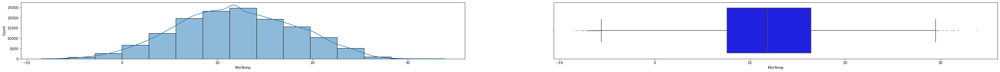

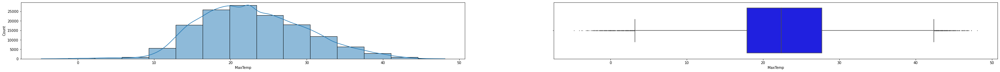

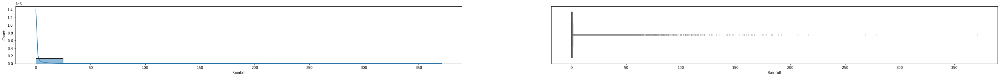

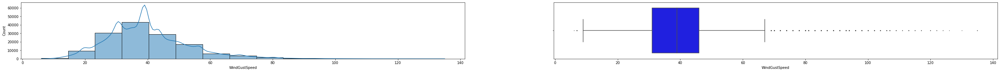

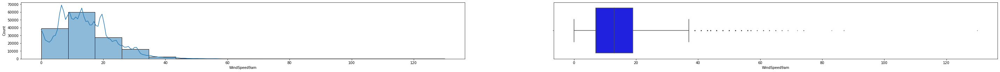

...

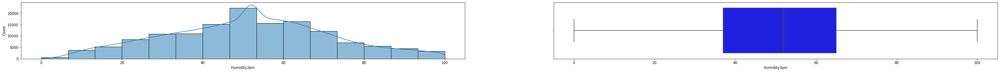

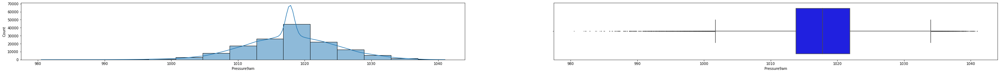

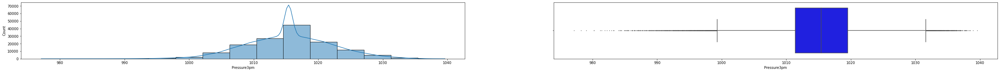

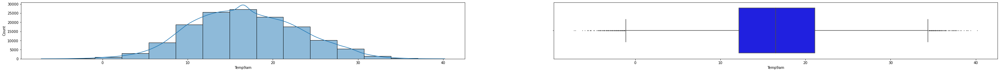

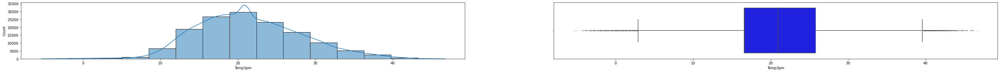

In [20]:
# --------------------------------------------------------------------
# Check the columns against the number of occurances - count of values
# --------------------------------------------------------------------
for i in num_col:
    fig, axs = plt.subplots(1,2,figsize=(50,3))
    sns.histplot(df_csv[i],bins=15, kde=True, ax=axs[0])
    sns.boxplot(df_csv[i], ax = axs[1], color='#0000FF', fliersize=1)

<AxesSubplot:xlabel='count', ylabel='Location'>

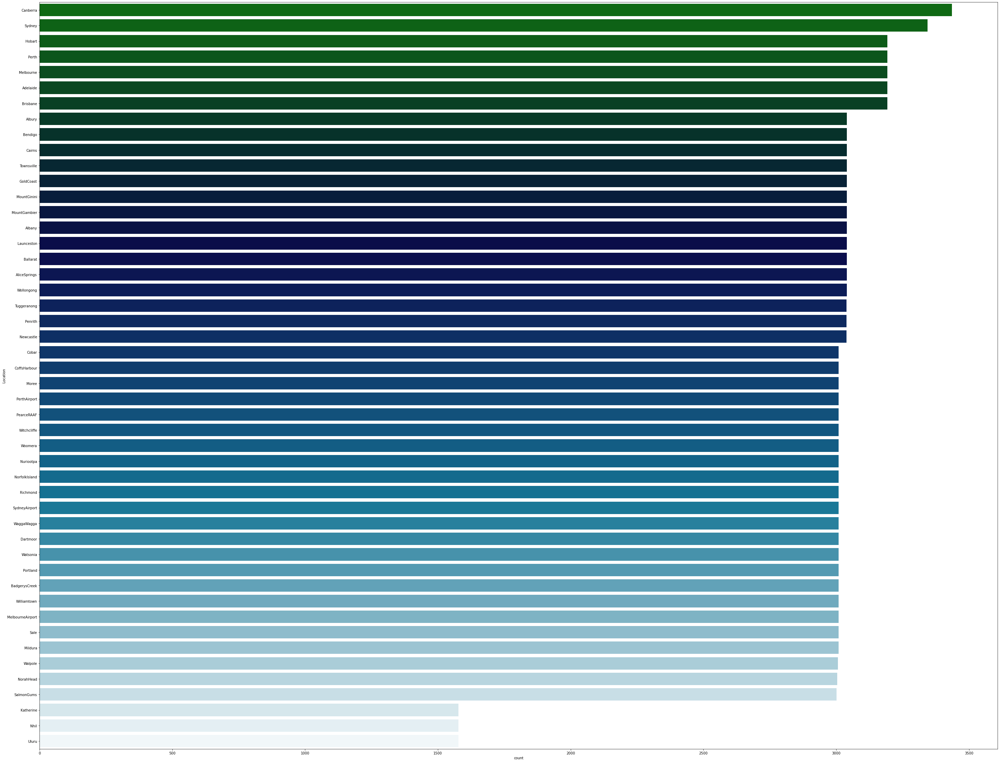

In [21]:
# Let's plot a count plot with X axis having the count and Y axis having the location

plt.figure(figsize=(50, 40))
sns.countplot(y="Location", data=df_csv, palette = 'ocean', order = df_csv['Location'].value_counts().index)

<AxesSubplot:>

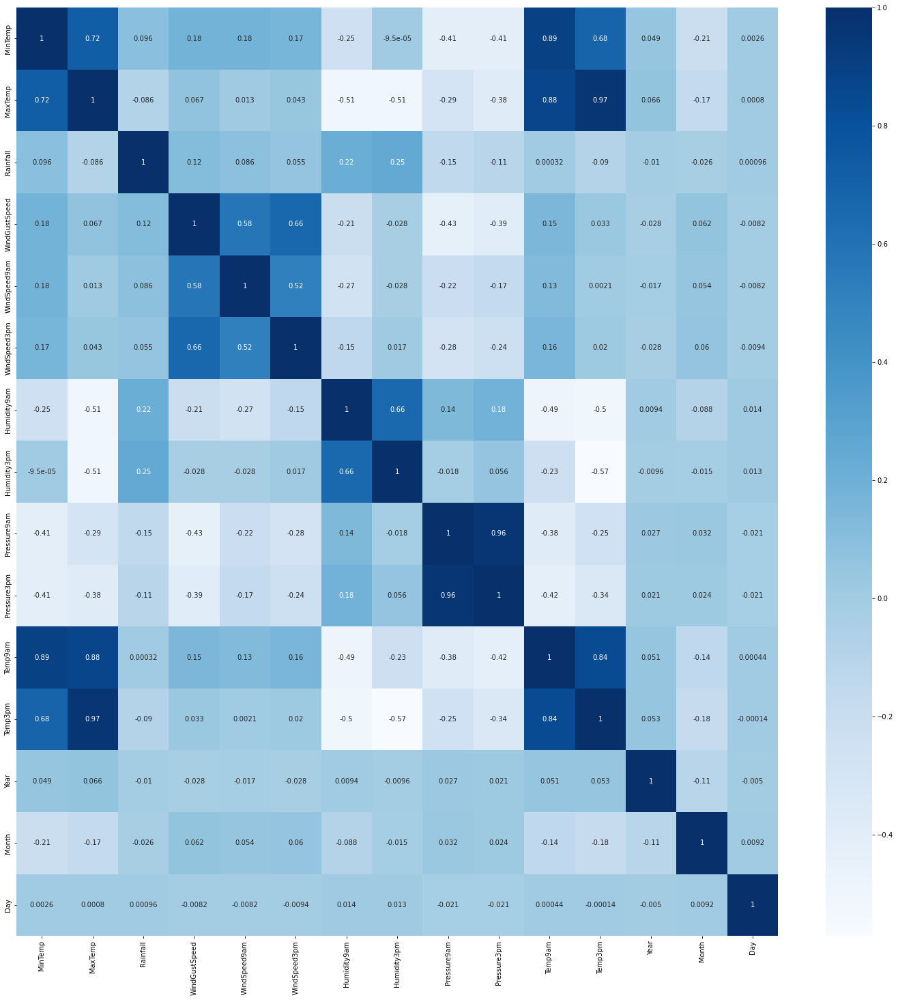

In [22]:
# ----------------------------------------------------------------------
# Assignment Objective 6.1 : Present 2 charts with Seaborn or Matplotlib
# ----------------------------------------------------------------------

# Plotting correlation matrix

correlation_matrix = df_csv.corr()
plt.figure(figsize=(25,25))
sns.heatmap(correlation_matrix,cmap='Blues',annot=True)

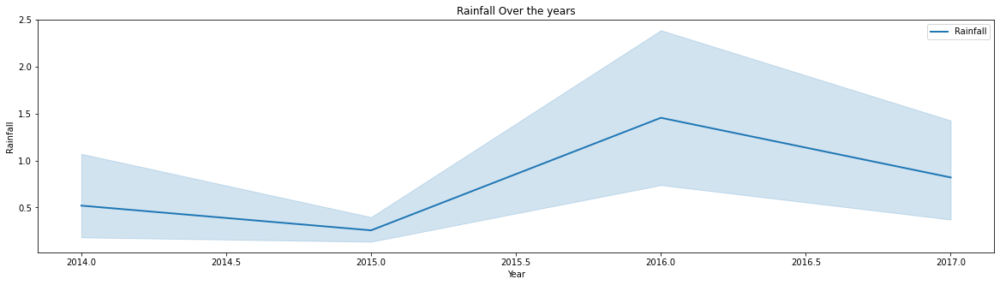

In [23]:
df_date = df_csv.iloc[-1200:,:]
plt.figure(figsize=(20,5))
sns.lineplot(x=df_date['Year'],y=df_date['Rainfall'],linewidth=2, label= 'Rainfall')
plt.title('Rainfall Over the years')
plt.show()

In [24]:
# ----------------------------------------------------------------------
# Assignment Objective 6.1 : Present 2 charts with Seaborn or Matplotlib
# ----------------------------------------------------------------------

# Create histogram for frequency of rain today by location
# This will help us identify the count between rain today/tomorrow vs Location
df_csv.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (30,7)
matplotlib.rcParams['figure.facecolor'] = '#00000000'
px.histogram(df_csv, x='Location', title='Location VS Number of Rainy Days', color='RainToday')


In [25]:
#plt.hist(df_csv['Location'], 50, density=True, facecolor='b', alpha=0.75)

In [26]:
# Select the numeric columns and plot them to see any patterns 

df_numeric = df_csv.select_dtypes(include = ['float64'])
df_numeric.head()
df_numeric.columns

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am',
       'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am',
       'Pressure3pm', 'Temp9am', 'Temp3pm'],
      dtype='object')

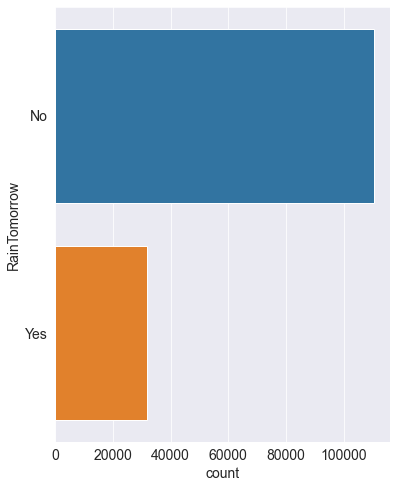

In [27]:
# ----------------------------------------------------------------------
# Assignment Objective 6.1 : Present 2 charts with Seaborn or Matplotlib
# ----------------------------------------------------------------------

df_numeric.shape
df_csv['RainTomorrow'].unique()

#View the Frequency Distribution
df_csv['RainTomorrow'].value_counts()

f, ax = plt.subplots(figsize=(6, 8))
ax = sns.countplot(y="RainTomorrow", data=df_csv)
plt.show()

In [28]:
# We can see from the above figure that there are more number of NO values as compared to YES values in the data.
# We can say that the data is imbalanced.
# But we can ignore it as it's primarily based on location and other factors which can hugely vary the probability of Rain

(142267, 6)

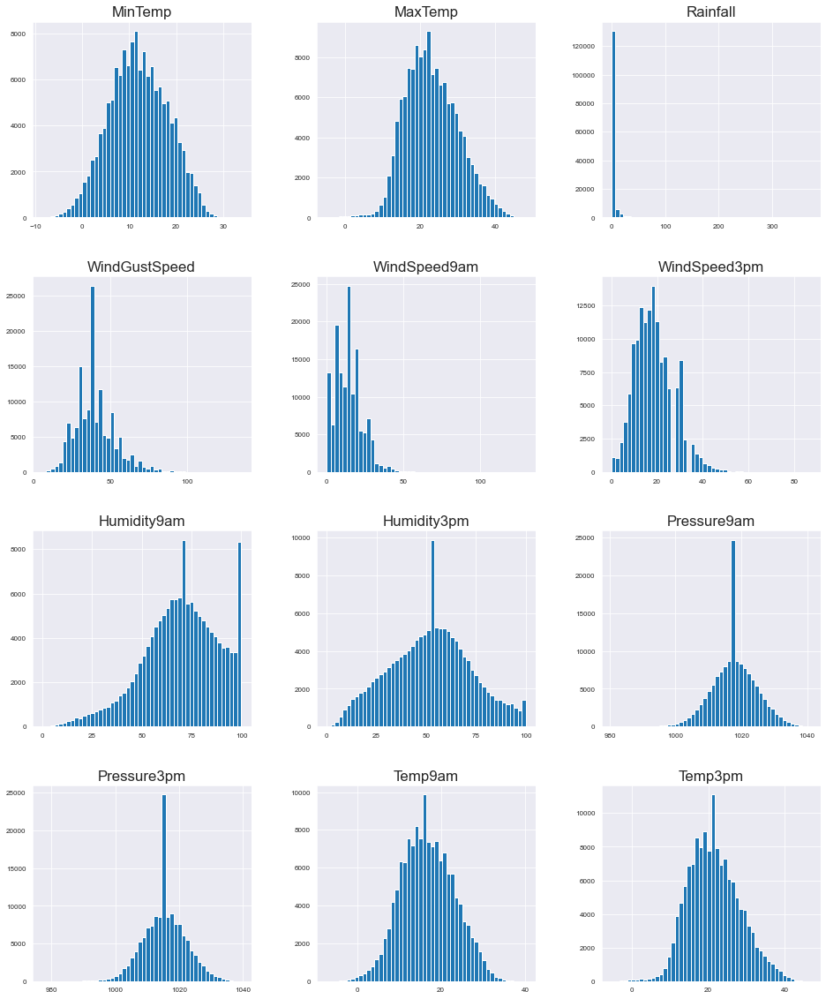

In [29]:
# Histogram for Numerical Variables

df_numeric.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

# Exploring Categorical Variables

df_cat = df_csv.select_dtypes(include = ['O'])
df_cat.head()

df_cat.shape

In [30]:
df_csv.head(10)

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,Albury,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,...,22.0,1007.7,1007.1,16.9,21.8,No,No,2008,12,1
1,Albury,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,...,25.0,1010.6,1007.8,17.2,24.3,No,No,2008,12,2
2,Albury,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,...,30.0,1007.6,1008.7,21.0,23.2,No,No,2008,12,3
3,Albury,9.2,28.0,0.0,NE,24.0,SE,E,11.0,9.0,...,16.0,1017.6,1012.8,18.1,26.5,No,No,2008,12,4
4,Albury,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,20.0,...,33.0,1010.8,1006.0,17.8,29.7,No,No,2008,12,5
5,Albury,14.6,29.7,0.2,WNW,56.0,W,W,19.0,24.0,...,23.0,1009.2,1005.4,20.6,28.9,No,No,2008,12,6
6,Albury,14.3,25.0,0.0,W,50.0,SW,W,20.0,24.0,...,19.0,1009.6,1008.2,18.1,24.6,No,No,2008,12,7
7,Albury,7.7,26.7,0.0,W,35.0,SSE,W,6.0,17.0,...,19.0,1013.4,1010.1,16.3,25.5,No,No,2008,12,8
8,Albury,9.7,31.9,0.0,NNW,80.0,SE,NW,7.0,28.0,...,9.0,1008.9,1003.6,18.3,30.2,No,Yes,2008,12,9
9,Albury,13.1,30.1,1.4,W,28.0,S,SSE,15.0,11.0,...,27.0,1007.0,1005.7,20.1,28.2,Yes,No,2008,12,10


In [31]:
df_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142267 entries, 0 to 142266
Data columns (total 21 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       142267 non-null  object 
 1   MinTemp        142267 non-null  float64
 2   MaxTemp        142267 non-null  float64
 3   Rainfall       142267 non-null  float64
 4   WindGustDir    142267 non-null  object 
 5   WindGustSpeed  142267 non-null  float64
 6   WindDir9am     142267 non-null  object 
 7   WindDir3pm     142267 non-null  object 
 8   WindSpeed9am   142267 non-null  float64
 9   WindSpeed3pm   142267 non-null  float64
 10  Humidity9am    142267 non-null  float64
 11  Humidity3pm    142267 non-null  float64
 12  Pressure9am    142267 non-null  float64
 13  Pressure3pm    142267 non-null  float64
 14  Temp9am        142267 non-null  float64
 15  Temp3pm        142267 non-null  float64
 16  RainToday      142267 non-null  object 
 17  RainTomorrow   142267 non-nul

## 6. Applying Machine Learning

In [32]:
# Extract the categorical features
category_column=df_csv.select_dtypes(object).columns.tolist()
len(category_column)

6

In [33]:
# Encode the categorical columns found above
le = LabelEncoder()
df_csv[category_column] =df_csv[category_column].astype('str').apply(le.fit_transform)
df_csv.head(10)

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month,Day
0,2,13.4,22.9,0.6,13,44.0,13,14,20.0,24.0,...,22.0,1007.7,1007.1,16.9,21.8,0,0,2008,12,1
1,2,7.4,25.1,0.0,14,44.0,6,15,4.0,22.0,...,25.0,1010.6,1007.8,17.2,24.3,0,0,2008,12,2
2,2,12.9,25.7,0.0,15,46.0,13,15,19.0,26.0,...,30.0,1007.6,1008.7,21.0,23.2,0,0,2008,12,3
3,2,9.2,28.0,0.0,4,24.0,9,0,11.0,9.0,...,16.0,1017.6,1012.8,18.1,26.5,0,0,2008,12,4
4,2,17.5,32.3,1.0,13,41.0,1,7,7.0,20.0,...,33.0,1010.8,1006.0,17.8,29.7,0,0,2008,12,5
5,2,14.6,29.7,0.2,14,56.0,13,13,19.0,24.0,...,23.0,1009.2,1005.4,20.6,28.9,0,0,2008,12,6
6,2,14.3,25.0,0.0,13,50.0,12,13,20.0,24.0,...,19.0,1009.6,1008.2,18.1,24.6,0,0,2008,12,7
7,2,7.7,26.7,0.0,13,35.0,10,13,6.0,17.0,...,19.0,1013.4,1010.1,16.3,25.5,0,0,2008,12,8
8,2,9.7,31.9,0.0,6,80.0,9,7,7.0,28.0,...,9.0,1008.9,1003.6,18.3,30.2,0,1,2008,12,9
9,2,13.1,30.1,1.4,13,28.0,8,10,15.0,11.0,...,27.0,1007.0,1005.7,20.1,28.2,1,0,2008,12,10


In [34]:
df_csv.shape

(142267, 21)

In [35]:
category_column

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

In [36]:
# spliting training and testing data
X = df_csv.drop(['RainTomorrow'], axis = 1)
y = df_csv['RainTomorrow']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.25,random_state=27)

In [37]:
print("X_train:", X_train.shape)
print("X_test:", X_test.shape)
print("y_train:", y_train.shape)
print("y_test:", y_test.shape)

X_train: (106700, 20)
X_test: (35567, 20)
y_train: (106700,)
y_test: (35567,)


#### Using Logistic Regression

In [38]:
# Initiatlize the Logistic Regression Classifier
logisticRegression = LogisticRegression(solver='liblinear')

# Fit the model
logisticRegression.fit(X_train, y_train)

# Predict
y_pred_test = logisticRegression.predict(X_test)

#Accuracy
logisticAccuracy = round(accuracy_score(y_test, y_pred_test) * 100, 2)

# Print accuracy scores
print(f'Model accuracy score: {logisticAccuracy}%')

Model accuracy score: 83.59%


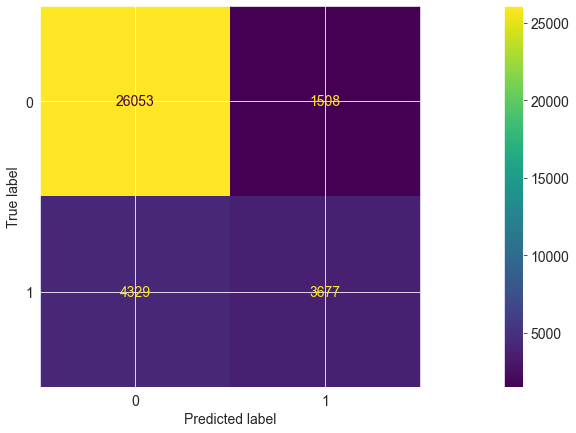

In [39]:
# Plot the Confusion Matrix
plot_confusion_matrix(logisticRegression, X_test,y_test)

In [40]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.86      0.95      0.90     27561
           1       0.71      0.46      0.56      8006

    accuracy                           0.84     35567
   macro avg       0.78      0.70      0.73     35567
weighted avg       0.82      0.84      0.82     35567



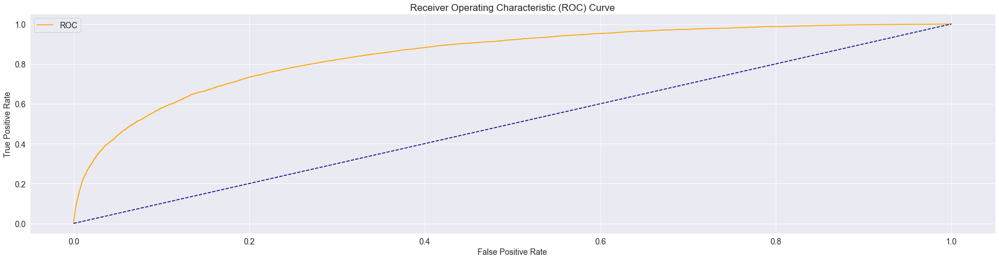

In [41]:
# Plot the ROC Curve

y_pred_probs = logisticRegression.predict_proba(X_test)  
y_pred_probs = y_pred_probs[:, 1]  
fper, tper, thresholds = roc_curve(y_test, y_pred_probs) 
roc_plot(fper, tper)

#### Using Decision Tree Classifier

In [42]:
# Initiatlize the Decision Tree Classifier
desisionTree = DecisionTreeClassifier( random_state=42, max_leaf_nodes=128, max_depth=10, )

# Fit the model
desisionTree.fit(X_train, y_train)

# Predict
y_pred_test = desisionTree.predict(X_test)

#Accuracy
decisionTreeAccuracy = round(accuracy_score(y_test, y_pred_test) * 100, 2)

# Print accuracy scores
print(f'Model accuracy score: {decisionTreeAccuracy}%')

Model accuracy score: 83.82%


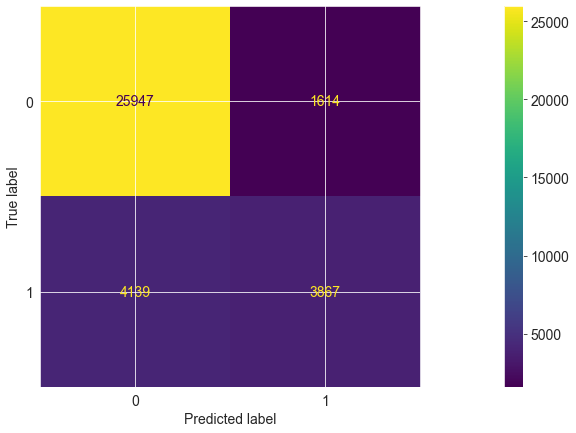

In [43]:
# Plot the Confusion Matrix
plot_confusion_matrix(desisionTree, X_test,y_test)

In [44]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.86      0.94      0.90     27561
           1       0.71      0.48      0.57      8006

    accuracy                           0.84     35567
   macro avg       0.78      0.71      0.74     35567
weighted avg       0.83      0.84      0.83     35567



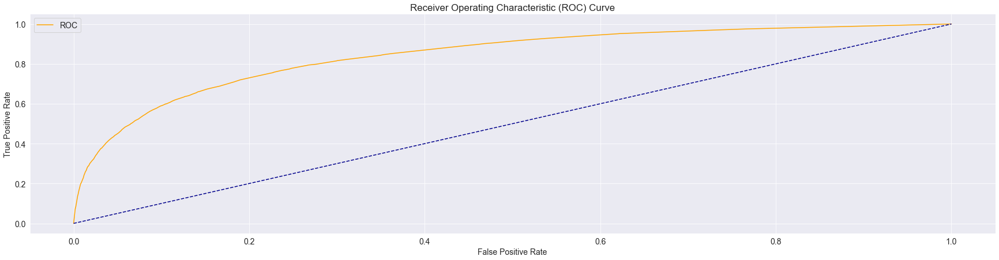

In [45]:
# Plot the ROC Curve

y_pred_probs = desisionTree.predict_proba(X_test)  
y_pred_probs = y_pred_probs[:, 1]  
fper, tper, thresholds = roc_curve(y_test, y_pred_probs) 
roc_plot(fper, tper)

#### Using Random Forest Classifier

In [46]:
# Initiatlize the Random Forest Classifier
randomForest = RandomForestClassifier(n_jobs=-1, random_state=50)

# Fit the model
randomForest.fit(X_train, y_train)

# Predict data points 
y_pred_test = randomForest.predict(X_test)

#Accuracy
randomForestAccuracy = round(accuracy_score(y_test, y_pred_test) * 100, 2)

# Print accuracy scores
print(f'Model accuracy score: {randomForestAccuracy}%')

Model accuracy score: 85.26%


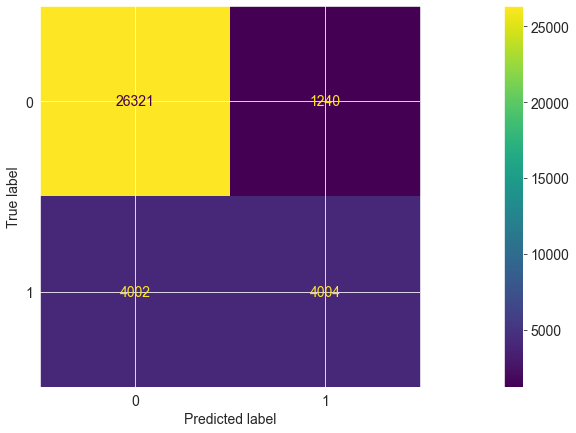

In [47]:
# Plot the Confusion Matrix
plot_confusion_matrix(randomForest, X_test,y_test)

In [48]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.87      0.96      0.91     27561
           1       0.76      0.50      0.60      8006

    accuracy                           0.85     35567
   macro avg       0.82      0.73      0.76     35567
weighted avg       0.84      0.85      0.84     35567



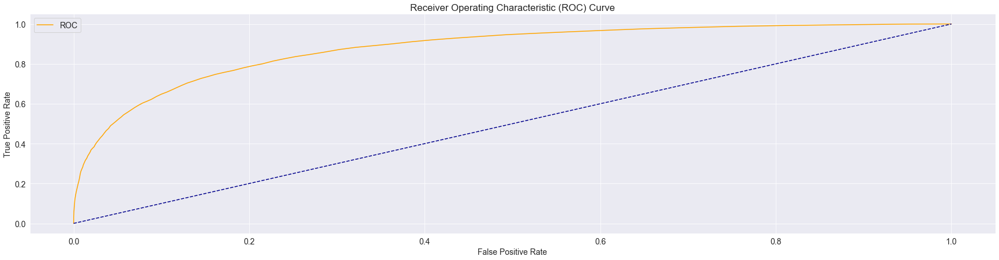

In [49]:
# Plot the ROC Curve

y_pred_probs = randomForest.predict_proba(X_test)  
y_pred_probs = y_pred_probs[:, 1]  
fper, tper, thresholds = roc_curve(y_test, y_pred_probs) 
roc_plot(fper, tper)

In [50]:
#from sklearn.model_selection import GridSearchCV, KFold
#kf = KFold(n_splits=10, shuffle=True, random_state=42)
#param_grid = {"solver": ["sag"]}
#logistic = LogisticRegression()
#log_cv = GridSearchCV(logistic, param_grid, cv=kf)
#log_cv.fit(X_train, y_train)
#print(log_cv.best_score_)

#### Collate all the results

In [51]:
model_accuracy = {'Model': ['Logistic Regression', 'Decision Tree Classifier', 'Random Forest Classifier'],
     'Accuracy' : [logisticAccuracy,decisionTreeAccuracy,randomForestAccuracy]}

accuracy_date = pd.DataFrame(data = model_accuracy)
accuracy_date

,Model,Accuracy
0,Logistic Regression,83.59
1,Decision Tree Classifier,83.82
2,Random Forest Classifier,85.26
